# ДЗ 1 по ML
*by Чернятин Александр*

## Генерация задания

In [1]:
from zlib import crc32
import numpy as np

types = ['regression', 'classification']
datasets = {'regression': [{'name': 'Servo Data Set',
                            'url': 'https://archive.ics.uci.edu/ml/datasets/Servo'},
                           {'name': 'Forest Fires Data Set',
                            'url': 'https://archive.ics.uci.edu/ml/datasets/Forest+Fires'},
                           {'name': 'Boston Housing Data Set',
                            'url': 'https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_boston.html#sklearn.datasets.load_boston'},
                           {'name': 'Diabetes Data Set',
                            'url': 'https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_diabetes.html#sklearn.datasets.load_diabetes'}],
            'classification': [{'name': 'Spambase Data Set',
                                'url': 'https://archive.ics.uci.edu/ml/datasets/Spambase'},
                               {'name': 'Wine Data Set',
                                'url': 'https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_wine.html#sklearn.datasets.load_wine'},
                               {'name': 'Breast Cancer Data Set',
                                'url': 'https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_breast_cancer.html#sklearn.datasets.load_breast_cancer'},
                               {'name': 'MNIST',
                                'url': 'http://yann.lecun.com/exdb/mnist/'}]}
methods = {'regression': ['Линейная регрессия',
                          'Перцептрон',
                          'Надарая-Ватсона',
                          'SVR'],
           'classification': ['Логистическая регрессия',
                              'Перцептрон',
                              'k-ближайших соседей',
                              'Метод потенциальных функций',
                              'Метод Парзеновского окна',
                              'SVM']}
task = dict()
task['mail'] = input(prompt='Enter your mail: ')
task['id'] = crc32(task['mail'].encode('utf-8'))
np.random.seed(task['id'])
task['type'] = np.random.choice(types)
task['dataset'] = np.random.choice(datasets[task['type']])
task['method'] = np.random.choice(
    methods[task['type']], size=3, replace=False).tolist()


task

Enter your mail: cherniatin.am@phystech.edu


{'mail': 'cherniatin.am@phystech.edu',
 'id': 4071938006,
 'type': 'classification',
 'dataset': {'name': 'Breast Cancer Data Set',
  'url': 'https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_breast_cancer.html#sklearn.datasets.load_breast_cancer'},
 'method': ['Логистическая регрессия',
  'k-ближайших соседей',
  'Метод Парзеновского окна']}

## Решение

### Эпиграф

Тут записано все то что я хотел бы объяснить прежде чем приступать к заданию:

При выполнении данного задания я использовал готовый код из презентаций с семинаров. Считаю нужным честно упомянуть это здесь, на случай проблем с плагиатом.

### Вступление

In [2]:
try:
    import google.colab
    IN_COLAB = True
except:
    IN_COLAB = False

if IN_COLAB:
    !wget -q -O requirements.txt https://raw.githubusercontent.com/andriygav/MachineLearningSeminars/master/sem1/requirements.txt
    !pip install -q -r requirements.txt

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

In [4]:
np.random.seed(42)

### Анализ выборки

#### Подготовка данных

Выборка взята в соответствии с инструкцией по URL выше, там же есть ссылка на оригинальный источник.

In [5]:
from sklearn.datasets import load_breast_cancer

breast_cancer_data = load_breast_cancer()
X, y = np.array(breast_cancer_data.data), np.array(breast_cancer_data.target)
feature_names = np.array(breast_cancer_data.feature_names)
print(breast_cancer_data.DESCR)

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [6]:
print(feature_names)

['mean radius' 'mean texture' 'mean perimeter' 'mean area'
 'mean smoothness' 'mean compactness' 'mean concavity'
 'mean concave points' 'mean symmetry' 'mean fractal dimension'
 'radius error' 'texture error' 'perimeter error' 'area error'
 'smoothness error' 'compactness error' 'concavity error'
 'concave points error' 'symmetry error' 'fractal dimension error'
 'worst radius' 'worst texture' 'worst perimeter' 'worst area'
 'worst smoothness' 'worst compactness' 'worst concavity'
 'worst concave points' 'worst symmetry' 'worst fractal dimension']


In [7]:
np.random.seed(42)

raw_dataset = pd.DataFrame(X, columns=feature_names)
raw_dataset['target'] = y
raw_dataset.sample(5)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
204,12.47,18.60,81.09,481.9,0.09965,0.1058,0.08005,0.03821,0.1925,0.06373,...,24.64,96.05,677.9,0.1426,0.2378,0.2671,0.10150,0.3014,0.08750,1
70,18.94,21.31,123.60,1130.0,0.09009,0.1029,0.10800,0.07951,0.1582,0.05461,...,26.58,165.90,1866.0,0.1193,0.2336,0.2687,0.17890,0.2551,0.06589,0
131,15.46,19.48,101.70,748.9,0.10920,0.1223,0.14660,0.08087,0.1931,0.05796,...,26.00,124.90,1156.0,0.1546,0.2394,0.3791,0.15140,0.2837,0.08019,0
431,12.40,17.68,81.47,467.8,0.10540,0.1316,0.07741,0.02799,0.1811,0.07102,...,22.91,89.61,515.8,0.1450,0.2629,0.2403,0.07370,0.2556,0.09359,1
540,11.54,14.44,74.65,402.9,0.09984,0.1120,0.06737,0.02594,0.1818,0.06782,...,19.68,78.78,457.8,0.1345,0.2118,0.1797,0.06918,0.2329,0.08134,1


In [8]:
from sklearn.model_selection import train_test_split

raw_train, raw_test = train_test_split(raw_dataset, test_size=0.2, random_state=42)

#### Анализ

Посчитаем пропорциональность размеров классов в нашей выборке:

In [9]:
print((raw_test['target'] == 0).sum() / (raw_test['target'] == 1).sum())

0.6056338028169014


Они достаточно близки, чтобы не делать поправку, ведь один лишь примерно в полтора раза больше другого.

Построим графики попарных созависимостемостей параметров

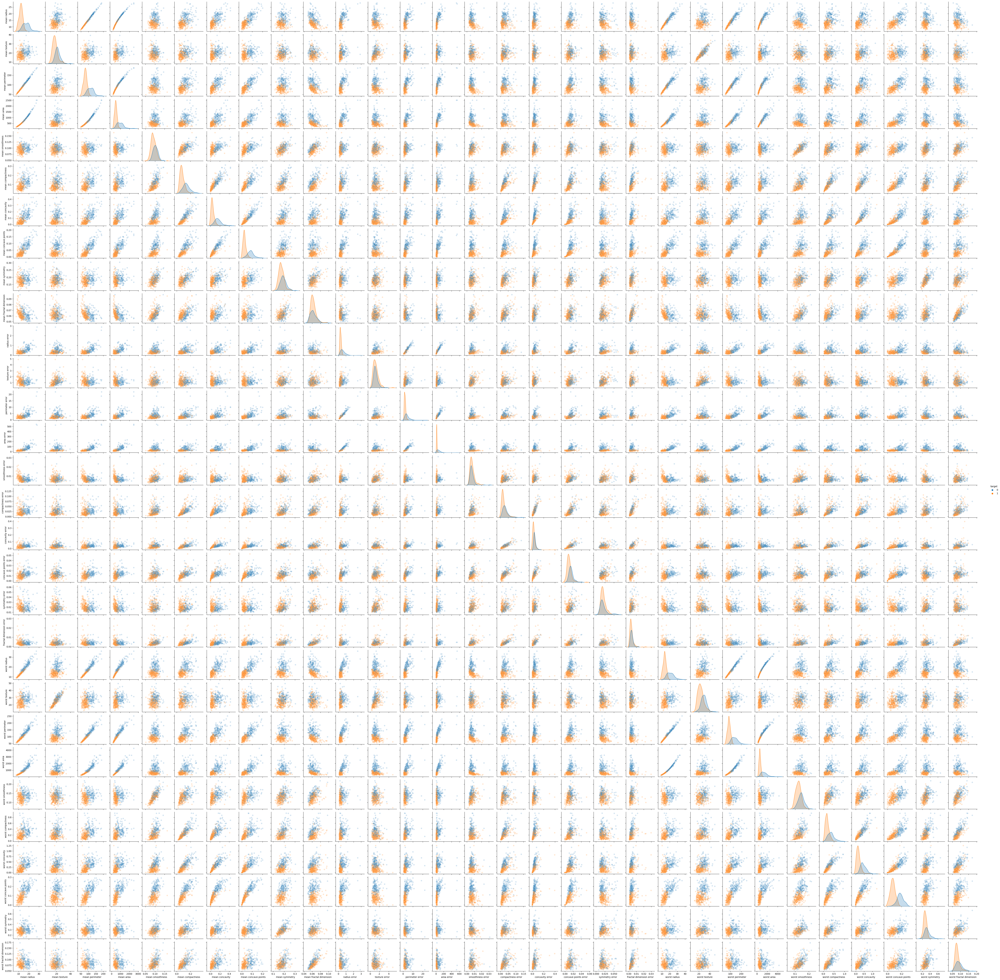

In [10]:
sns.pairplot(raw_train, hue='target', height=2, plot_kws={'alpha':0.2})
plt.show()

Классы не разделяются явно, однако они относительно сгруппированы, и в большинстве случаев даже разделимы прямой с относительно небольшим количеством ошибок, что показывает, что все предложенные методы анализа применимы в данном случае.

Построим матрицу корелляций:

<Axes: >

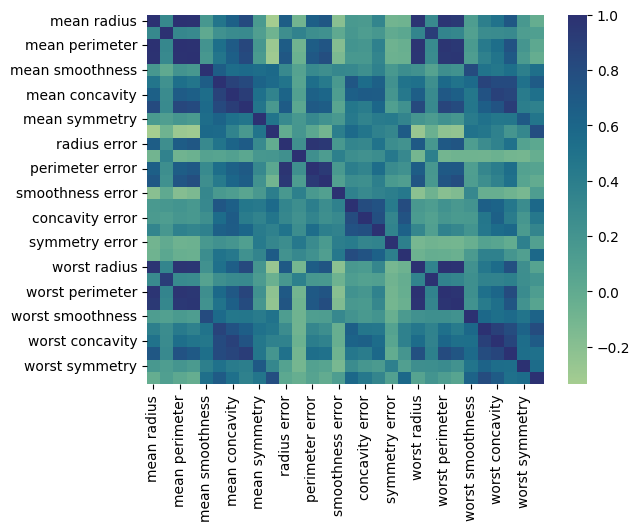

In [11]:
sns.heatmap(raw_train.iloc[:, :-1].corr(), cmap='crest')

Данные сильно коррелированы, что будет проблемой в приминении предлженных методов. Требуется уменьшить корелляции для успешного проведения эксперимента.

### Препроцессинг данных

Используем PCA, чтобы уменьшить число признаков и корреляцию (код из https://scikit-learn.org/stable/auto_examples/preprocessing/plot_scaling_importance.html и https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

In [12]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

processing_train = raw_train.iloc[:, :-1]

scaler = StandardScaler().set_output(transform="pandas")
processing_train = scaler.fit_transform(processing_train)


pca = PCA(n_components = 0.95).set_output(transform="pandas")
pca.fit(processing_train)
train = pca.transform(processing_train)

train['target'] = raw_train['target']

Проверим что все вышло

In [13]:
np.random.seed(42)
train.sample(5)

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,target
95,4.395097,-2.153753,0.555721,0.972339,-0.052339,1.689848,-0.106500,0.385588,-0.640080,0.429249,0
93,-1.923293,-0.939878,-0.100391,0.195544,-0.597171,-0.318648,-0.481066,-0.486760,0.094603,-0.486617,1
401,-3.396624,-0.957952,-0.629574,-1.422305,0.018868,-0.624910,-0.015243,-0.196017,0.100959,-0.557687,1
345,-2.378064,3.396611,3.350515,-0.304061,-1.516003,-0.910786,-0.753025,1.080531,-1.883129,-0.716256,1
194,2.637476,1.546163,-0.269637,0.411305,1.066876,-0.176563,-0.771367,0.194547,0.043957,-0.358986,0


Теперь повторим построение графиков созависимостей и матрицы корреляций, чтобы убедиться, что датасет обработан успешно

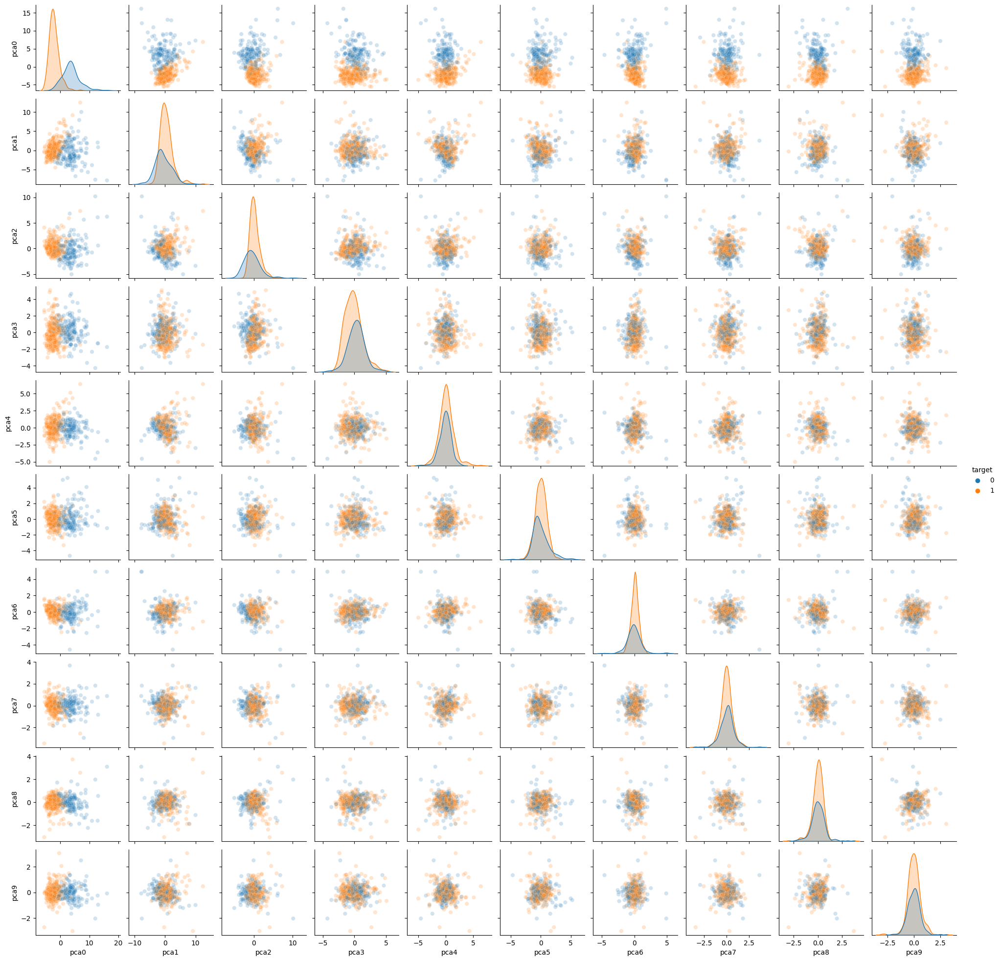

In [14]:
sns.pairplot(train, hue='target', height=2, plot_kws={'alpha':0.2})
plt.show()

<Axes: >

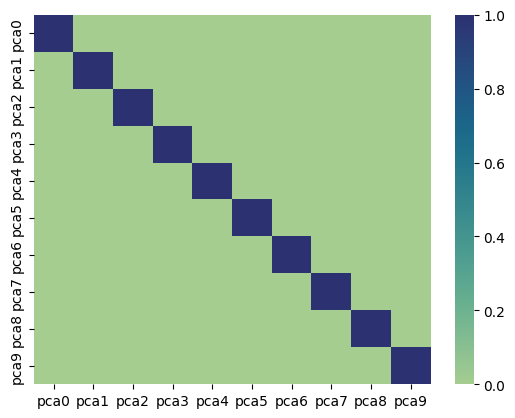

In [15]:
sns.heatmap(train.iloc[:, :-1].corr(), cmap='crest')

Теперь применим полученные веса к тестовой выборке, для дальнейшего тестирования

In [16]:
processing_test = raw_test.iloc[:, :-1]

processing_test = scaler.transform(processing_test)

test = pca.transform(processing_test)

test['target'] = raw_test['target']

Теперь, когда мы избавились от корелляции, можно приступать к применению предложенных методов для тренировки моделей.

### Эксперименты

In [17]:
X_train = train.iloc[:, :-1]
y_train = train['target']

X_test = test.iloc[:, :-1]
y_test = test['target']

В задаче бинарной классификации MSE и доля неверно угаданных совпадают, для удобства используем MSE.

#### Логистическая регрессия

Создаем модель

In [18]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

In [19]:
lr_model = LogisticRegression(random_state=42, max_iter=100)

Тренируем модель

In [20]:
lr_model.fit(X_train, y_train)

LogisticRegression(random_state=42)

Смотрим среднеквадратичную ошибку на тестовой выборке и матрицу ошибок

In [21]:
mse = mean_squared_error(y_test, lr_model.predict(X_test))
print("The mean squared error (MSE) on test set: {:.4f}".format(mse))

The mean squared error (MSE) on test set: 0.0175


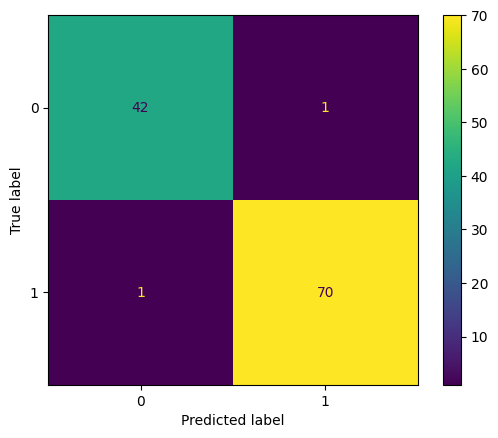

In [22]:
ConfusionMatrixDisplay(confusion_matrix(y_test, lr_model.predict(X_test))).plot()

График MSE от количества итераций тренировки (не обращайте внимание на предупреждения - все так и должно быть)

In [23]:
iterations = np.arange(1, 100, 1)
mse_scores_train = np.array([])
mse_scores_test = np.array([])

for n_iter in iterations:
  lr_model_n = LogisticRegression(random_state=42, max_iter=n_iter)
  lr_model_n.fit(X_train, y_train)
  mse_scores_train = np.append(mse_scores_train, [mean_squared_error(y_train, lr_model_n.predict(X_train))])
  mse_scores_test = np.append(mse_scores_test, [mean_squared_error(y_test, lr_model_n.predict(X_test))])

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

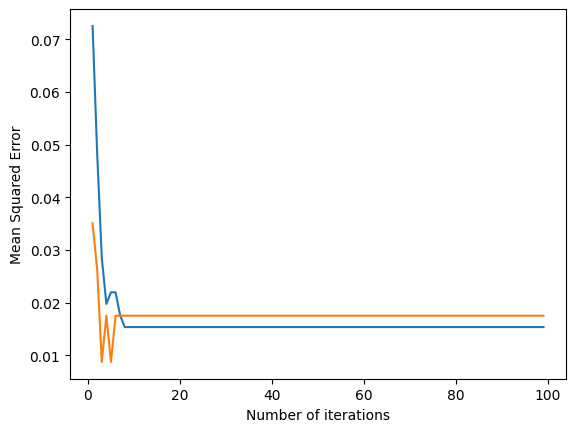

In [24]:
sns.lineplot(x=iterations, y=mse_scores_train)
sns.lineplot(x=iterations, y=mse_scores_test)
plt.xlabel('Number of iterations')
plt.ylabel('Mean Squared Error')
plt.show()

#### KNN

Создаем модель

In [25]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import mean_squared_error
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

Подбираем параметр n (test_size подобран из соображений информативности графика)

In [26]:
mse_scores = np.array([])

X1, X2, y1, y2 = train_test_split(X_train, y_train, test_size=0.15, random_state=42)

for n in np.arange(1, 100, 1):
  knn_model_n = KNeighborsClassifier(n_neighbors=n)
  knn_model_n.fit(X1, y1)
  mse_scores = np.append(mse_scores, [mean_squared_error(y2, knn_model_n.predict(X2))])

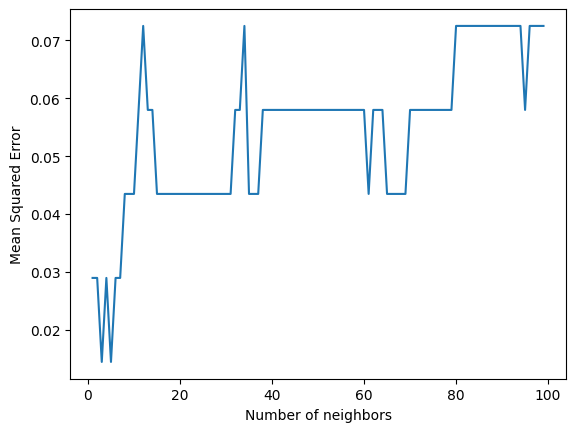

In [27]:
sns.lineplot(x=np.arange(1, 100, 1), y=mse_scores)
plt.xlabel('Number of neighbors')
plt.ylabel('Mean Squared Error')
plt.show()

In [28]:
print(mse_scores[65])

0.043478260869565216


По форме графика более-менее видно (не смотря на ступенчатость), что параметр n = 65 является одним из оптимальных

In [29]:
knn_model = KNeighborsClassifier(n_neighbors=65)

Тренируем модель

In [30]:
knn_model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=65)

Смотрим среднеквадратичную ошибку на тестовой выборке и матрицу ошибок

In [31]:
mse = mean_squared_error(y_test, knn_model.predict(X_test))
print("The mean squared error (MSE) on test set: {:.4f}".format(mse))

The mean squared error (MSE) on test set: 0.0351


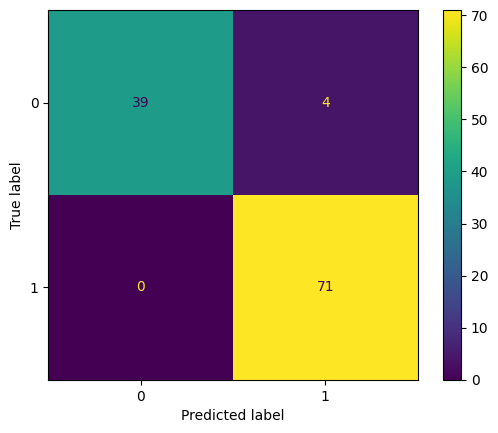

In [32]:
ConfusionMatrixDisplay(confusion_matrix(y_test, knn_model.predict(X_test))).plot()

График MSE на тестовой выборке в зависимости от параметра

In [33]:
mse_scores_train = np.array([])
mse_scores_test = np.array([])

for n in np.arange(1, 100, 1):
  knn_model_n = KNeighborsClassifier(n_neighbors=n)
  knn_model_n.fit(X_train, y_train)
  mse_scores_train = np.append(mse_scores_train, [mean_squared_error(y_train, knn_model_n.predict(X_train))])
  mse_scores_test = np.append(mse_scores_test, [mean_squared_error(y_test, knn_model_n.predict(X_test))])

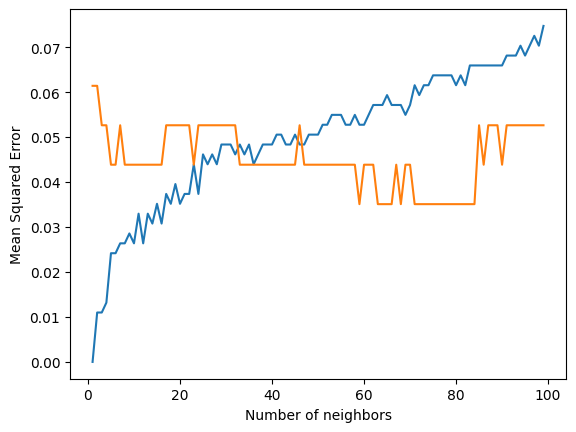

In [34]:
sns.lineplot(x=np.arange(1, 100, 1), y=mse_scores_train)
sns.lineplot(x=np.arange(1, 100, 1), y=mse_scores_test)
plt.xlabel('Number of neighbors')
plt.ylabel('Mean Squared Error')
plt.show()

#### Парзеновское окно

Вводим функцию kde

In [35]:
def kde(distance, h):
    ret = np.array(distance)/h
    return (1 - ret**2) * (np.abs(ret) <= 1)

Создаем модель

In [36]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import mean_squared_error
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

Подбираем параметр h (test_size подобран из соображений информативности графика)

In [37]:
kde_params = np.linspace(0.0001, 10.0001, 100) # to avoid division by 0
mse_scores = np.array([])

X1, X2, y1, y2 = train_test_split(X_train, y_train, test_size=0.4, random_state=42)

for h in kde_params:
  kde_model_n = KNeighborsClassifier(n_neighbors=len(X1), weights=lambda x: kde(x, h=h))
  kde_model_n.fit(X1, y1)
  mse_scores = np.append(mse_scores, [mean_squared_error(y2, kde_model_n.predict(X2))])

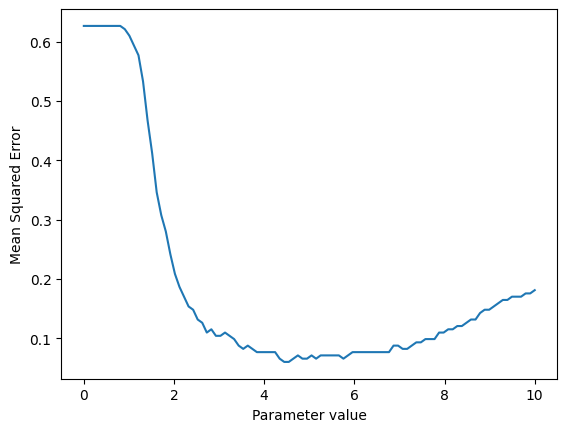

In [38]:
sns.lineplot(x=kde_params, y=mse_scores)
plt.xlabel('Parameter value')
plt.ylabel('Mean Squared Error')
plt.show()

In [39]:
print(mse_scores[65])

0.07692307692307693


Тогда задем h = 4



In [40]:
kde_model = KNeighborsClassifier(n_neighbors=len(X1), weights=lambda x: kde(x, h=4))

Тренируем модель

In [41]:
kde_model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=273,
                     weights=<function <lambda> at 0x7965f66970a0>)

Смотрим среднеквадратичную ошибку на тестовой выборке и матрицу ошибок

In [42]:
mse = mean_squared_error(y_test, kde_model.predict(X_test))
print("The mean squared error (MSE) on test set: {:.4f}".format(mse))

The mean squared error (MSE) on test set: 0.0614


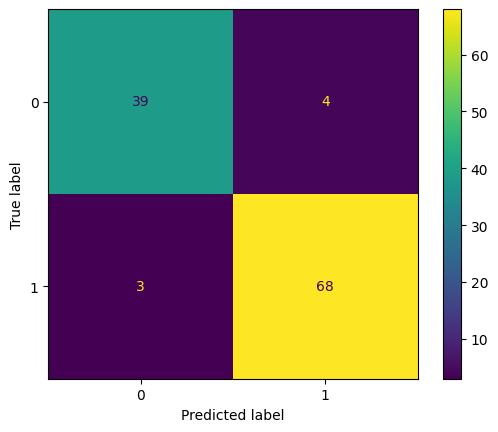

In [43]:
ConfusionMatrixDisplay(confusion_matrix(y_test, kde_model.predict(X_test))).plot()

График MSE на тестовой выборке в зависимости от параметра

In [44]:
kde_params = np.linspace(0.0001, 10.0001, 100) # to avoid division by 0
mse_scores_train = np.array([])
mse_scores_test = np.array([])

for h in kde_params:
  kde_model_n = KNeighborsClassifier(n_neighbors=len(X1), weights=lambda x: kde(x, h=h))
  kde_model_n.fit(X1, y1)
  mse_scores_train = np.append(mse_scores_train, [mean_squared_error(y_train, kde_model_n.predict(X_train))])
  mse_scores_test = np.append(mse_scores_test, [mean_squared_error(y_test, kde_model_n.predict(X_test))])

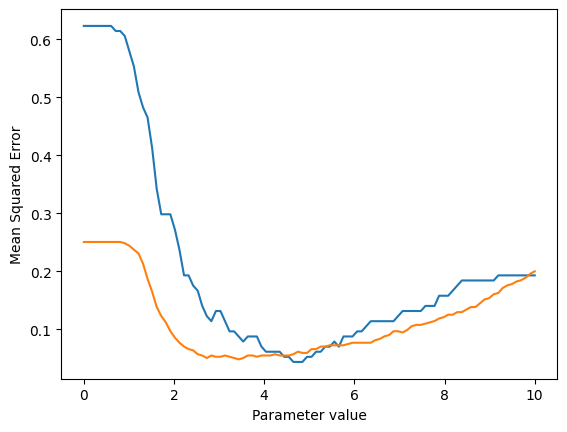

In [45]:
sns.lineplot(x=kde_params, y=mse_scores_test)
sns.lineplot(x=kde_params, y=mse_scores_train)
plt.xlabel('Parameter value')
plt.ylabel('Mean Squared Error')
plt.show()

### Заключение

В работе было произведено применение на практике методов линейной регрессии, k ближайших соседей и Парзеновского окна. Для достижения лучших результатов изначальный датасет был обработан методом главных компонент. В результате все методы показали себя хорошо, достигнув среднеквадратичной ошибки (то же самое, что и доля неверных предсказаний) ниже 0.05, что обычно берется за целевую отметку.

Поскольку размер датасета относительно небольшой, методы knn и Парзеновского окна были менее эффективны. В том числе представляло особую сложность подобрать параметр, поскольку любое разделение тренировочного набора давало столь малые размеры, что функция ошибки была слишком ступенчатой.

Также на повышенную эффективность более простых методов повлияло и то, что не смотря на малый размер датасета он был достаточно простым, т.е. классы достаточно легко разделялись, что значитильно увеличило сравнительную эффективность линейной регрессии.

Метод Парзеновского окна уступил knn в силу более удачного подбора параметра в knn, что обусловлено более удачным анализом графика, в том числе тем, что экстремиум на тестовой выборке в KDE оказался сдвинут влево, что невозможно было предсказать и является следствием высокой степени влияния случайности на малых размерах выборок.

Таким образом линейная регрессия показала себя лучше всего, что и следовало ожидать. KNN неожиданно оказался лучше метода Парзеновского окна, что связано со случайным стечением обстоятельств (тем как при зафискированном сиде разбились test и train). За исключением этого полученные результаты совпадают с теорией, позволившей, в том числе, успешно подобрать хорошие параметры в методах KNN и методе Парзеновского окна.

Считаю работу успешно проведенной с достижением весьма неплохих результатов во всех трех методах.